In [2]:
# Packages used
import numpy as np
import pandas as pd
import scanpy as sc

In [3]:
# Scanpy settings
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.8.1 anndata==0.7.6 umap==0.5.1 numpy==1.20.1 scipy==1.6.2 pandas==1.2.4 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.9.6 pynndescent==0.5.4


In [4]:
results_file = 'sc-bm-results.h5ad'  # The file that will store the analysis results

In [5]:
adata = sc.read_10x_h5(filename='ica_bone_marrow_h5.h5') # Returns AnnData type (Annotated data matrix)

reading ica_bone_marrow_h5.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:18)


In [6]:
adata.var_names_make_unique()
adata

AnnData object with n_obs × n_vars = 378000 × 33694
    var: 'gene_ids'

In [7]:
adata.X # The data matrix is stored in X

<378000x33694 sparse matrix of type '<class 'numpy.float32'>'
	with 303795547 stored elements in Compressed Sparse Row format>

In [8]:
adata.obs_names #Cell names

Index(['MantonBM1_HiSeq_1-AAACCTGAGCAGGTCA-1',
       'MantonBM1_HiSeq_1-AAACCTGCACACTGCG-1',
       'MantonBM1_HiSeq_1-AAACCTGCACCGGAAA-1',
       'MantonBM1_HiSeq_1-AAACCTGCATAGACTC-1',
       'MantonBM1_HiSeq_1-AAACCTGCATCGATGT-1',
       'MantonBM1_HiSeq_1-AAACCTGCATTCCTGC-1',
       'MantonBM1_HiSeq_1-AAACCTGGTTAAGGGC-1',
       'MantonBM1_HiSeq_1-AAACCTGGTTGTGGAG-1',
       'MantonBM1_HiSeq_1-AAACCTGTCACCTCGT-1',
       'MantonBM1_HiSeq_1-AAACCTGTCACGCATA-1',
       ...
       'MantonBM8_HiSeq_8-TTTGTCAAGTTTAGGA-1',
       'MantonBM8_HiSeq_8-TTTGTCACAACTGCTA-1',
       'MantonBM8_HiSeq_8-TTTGTCACACTGTGTA-1',
       'MantonBM8_HiSeq_8-TTTGTCAGTACCGCTG-1',
       'MantonBM8_HiSeq_8-TTTGTCAGTATCAGTC-1',
       'MantonBM8_HiSeq_8-TTTGTCAGTCAACATC-1',
       'MantonBM8_HiSeq_8-TTTGTCATCATTTGGG-1',
       'MantonBM8_HiSeq_8-TTTGTCATCCTCAACC-1',
       'MantonBM8_HiSeq_8-TTTGTCATCTGCCAGG-1',
       'MantonBM8_HiSeq_8-TTTGTCATCTTGAGAC-1'],
      dtype='object', length=378000)

In [9]:
adata.var_names #Gene names

Index(['RP11-34P13.3', 'FAM138A', 'OR4F5', 'RP11-34P13.7', 'RP11-34P13.8',
       'RP11-34P13.14', 'RP11-34P13.9', 'FO538757.3', 'FO538757.2',
       'AP006222.2',
       ...
       'AC007325.2', 'BX072566.1', 'AL354822.1', 'AC023491.2', 'AC004556.1',
       'AC233755.2', 'AC233755.1', 'AC240274.1', 'AC213203.1', 'FAM231B'],
      dtype='object', length=33694)

In [10]:
adata.var['gene_ids'] #Gene IDs

RP11-34P13.3    ENSG00000243485
FAM138A         ENSG00000237613
OR4F5           ENSG00000186092
RP11-34P13.7    ENSG00000238009
RP11-34P13.8    ENSG00000239945
                     ...       
AC233755.2      ENSG00000277856
AC233755.1      ENSG00000275063
AC240274.1      ENSG00000271254
AC213203.1      ENSG00000277475
FAM231B         ENSG00000268674
Name: gene_ids, Length: 33694, dtype: object

In [15]:
#adata.var['feature_types'] #Feature types
# I am not sure what the features are in this dataset

KeyError: 'feature_types'

## Preprocessing

normalizing counts per cell
    finished (0:00:11)


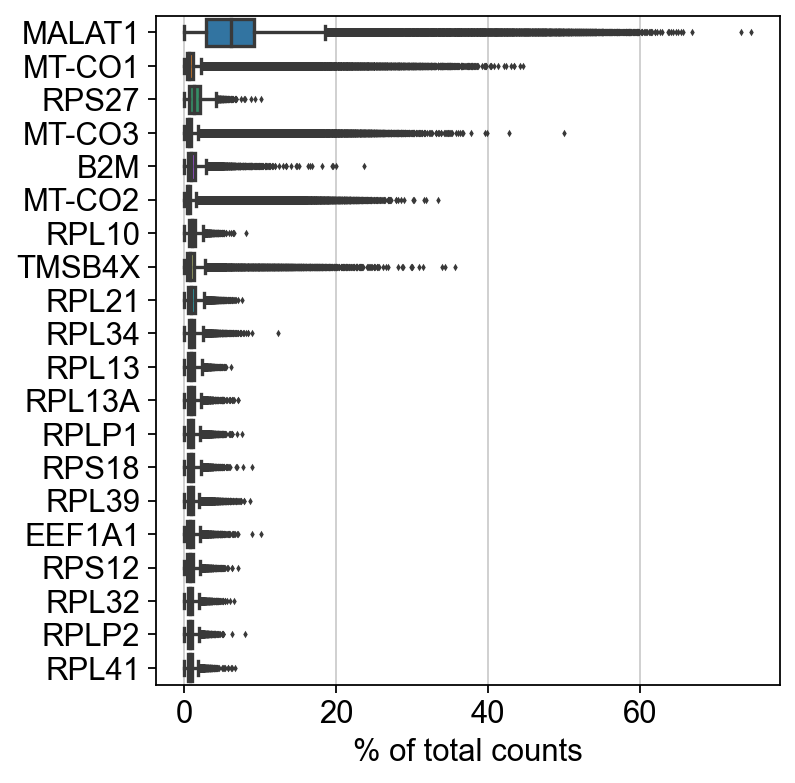

In [11]:
# Genes that have the highest fraction of counts in each cell, across all cells
sc.pl.highest_expr_genes(adata, n_top=20, )

In [12]:
# Basic filtering
sc.pp.filter_cells(adata, min_genes=200) # Filter out statistically insignificant cells
sc.pp.filter_genes(adata, min_cells=3) # Filter out statistically insignificant genes

filtered out 42382 cells that have less than 200 genes expressed
filtered out 8806 genes that are detected in less than 3 cells


In [13]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

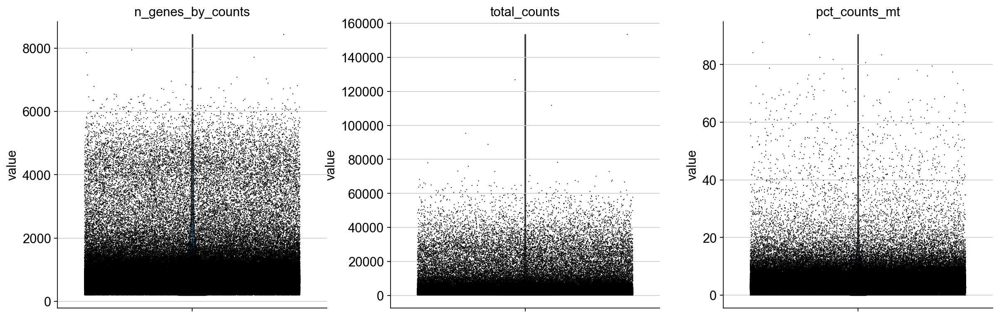

In [14]:
# Violin plot showing the computed quality measures
# Figure 1: The number of genes expressed in the count matrix
# Figure 2: The total counts per cell
# Figure 3: The percentage of counts in mitochondrial genes
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

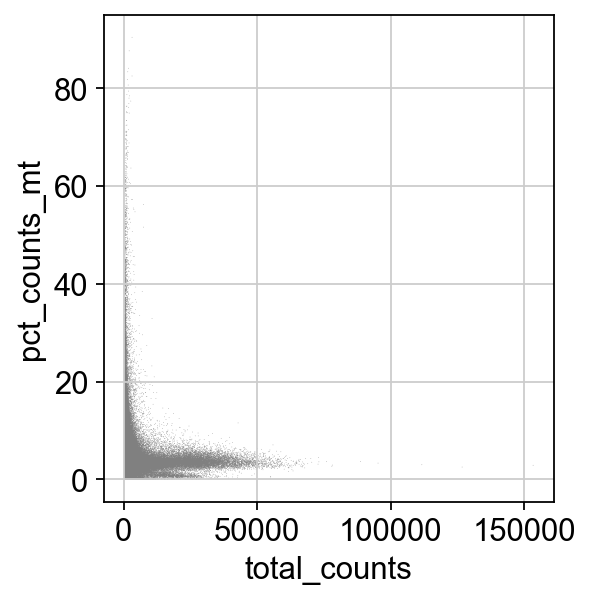

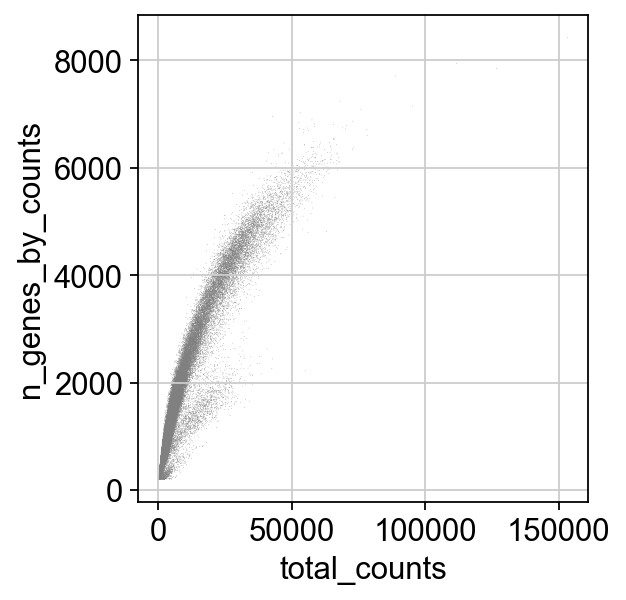

In [15]:
# Remove cells that have too many mitochondrial genes expressed or too many total counts:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [16]:
# Filtering by slicing the AnnData object
adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]

In [17]:
# Total-count normalize (library-size correct) the data matrix 𝐗 to 10,000 reads per cell, so that counts become comparable among cells.
sc.pp.normalize_total(adata, target_sum=1e4)

/Users/shehbeel/opt/anaconda3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:01)


In [18]:
# Logarthmize the data
sc.pp.log1p(adata)

In [19]:
# To identify highly-variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:05)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


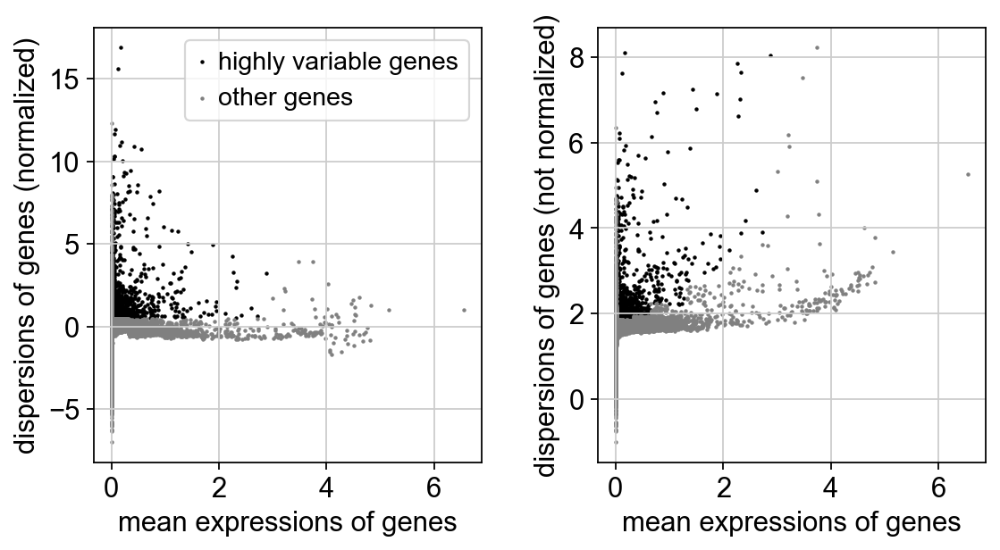

In [20]:
sc.pl.highly_variable_genes(adata)

In [21]:
# The .raw attribute of the AnnData object is set to normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.
adata.raw = adata

In [22]:
# Filtering
adata = adata[:, adata.var.highly_variable]

In [23]:
# Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed.
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:06:44)


In [24]:
# Scale each gene to unit variance. Clip values exceeding standard deviation 10.
sc.pp.scale(adata, max_value=10)

## Principal Component Analysis

In [25]:
# Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:34)


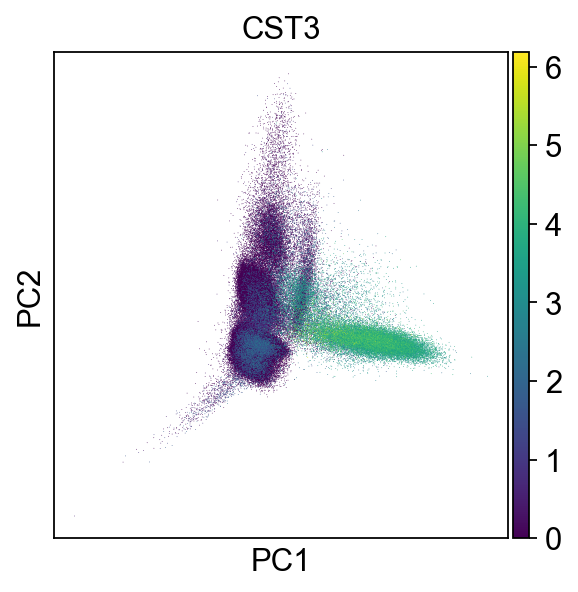

In [26]:
# Scatter plot in the PCA coordinates
sc.pl.pca(adata, color='CST3')

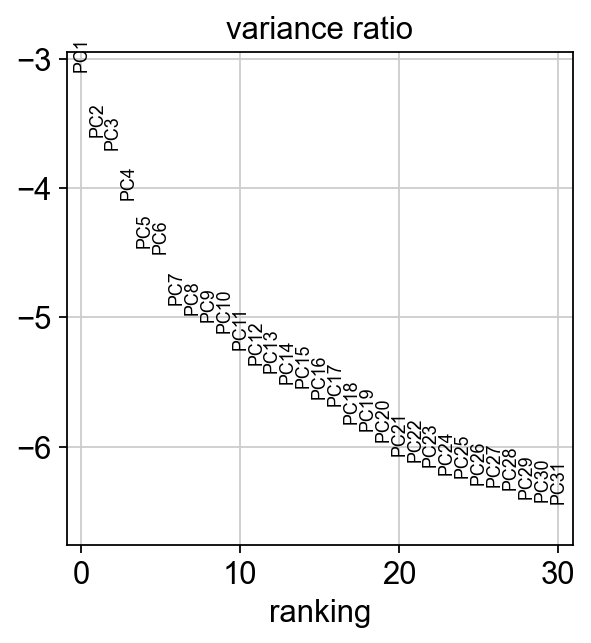

In [27]:
# Determining how many PCs to use in order to compute the neighborhood relations of cells (e.g., in the clustering function louvain or tSNE). This will show the contribution of single PCs to the total variance in the data.
sc.pl.pca_variance_ratio(adata, log=True)

In [28]:
# Save the analysis results
adata.write(results_file)
adata

AnnData object with n_obs × n_vars = 242781 × 1182
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

## Computing the neighborhood graph

In [29]:
# Compute the neighborhood graph of cells using the PCA representation of the data matrix. The default values can be used for parameters, but these values match more closely to Seurat.
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:25)


## Embedding the neighborhood graph

In [30]:
#Embed the graph in two dimensions using UMAP
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:25)


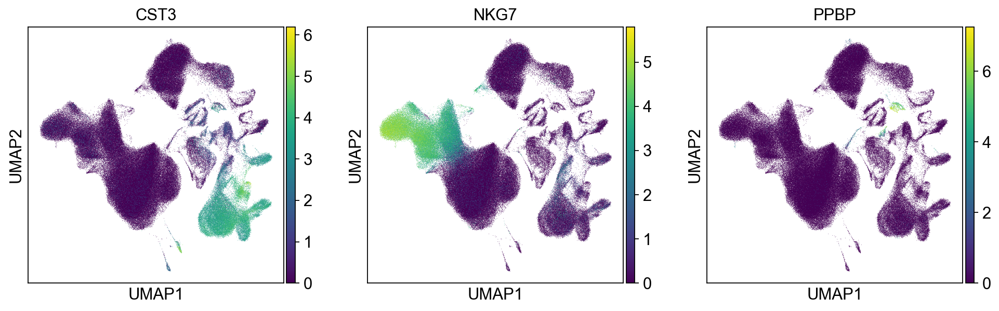

In [31]:
#This plot will show the “raw” (normalized, logarithmized, but uncorrected) gene expression.
sc.pl.umap(adata, color=['CST3', 'NKG7', 'PPBP'])

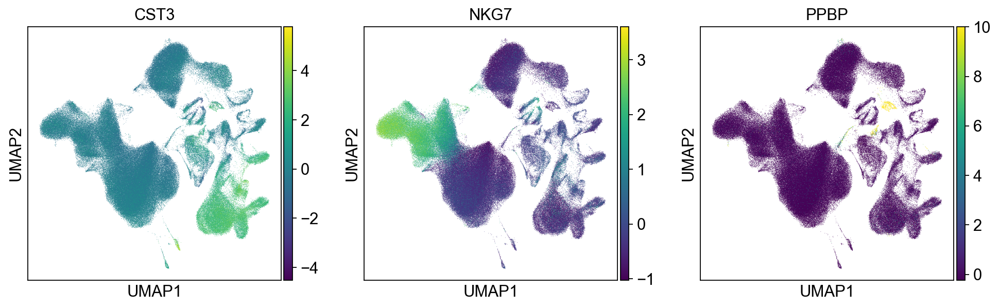

In [34]:
#This plot will show the scaled and corrected gene expression.
sc.pl.umap(adata, color=['CST3', 'NKG7', 'PPBP'], use_raw=False)

## Clustering the neighborhood graph

In [43]:
! pip install leidenalg

     |████████████████████████████████| 230 kB 389 kB/s eta 0:00:01
     |████████████████████████████████| 2.0 MB 159 kB/s eta 0:00:01


In [35]:
#Use the Leiden graph-clustering method, which directly clusters the neighborhood graph of cells, which we already computed above.
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 29 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:02:22)


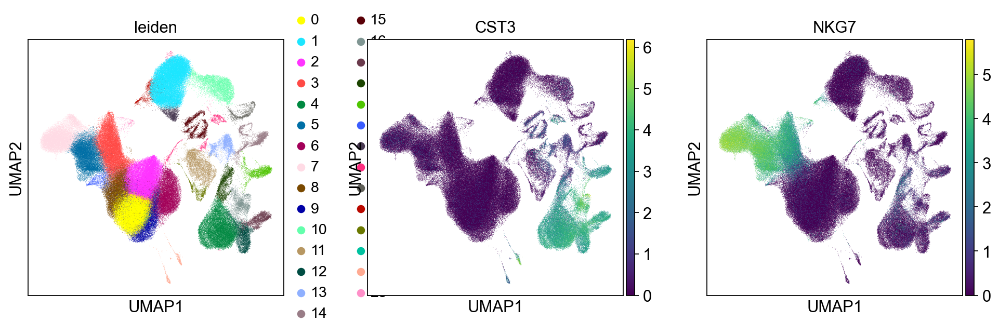

In [36]:
#Plotting the clusters
sc.pl.umap(adata, color=['leiden', 'CST3', 'NKG7'])

In [37]:
#Save the result
adata.write(results_file)

## Finding marker genes

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:10)


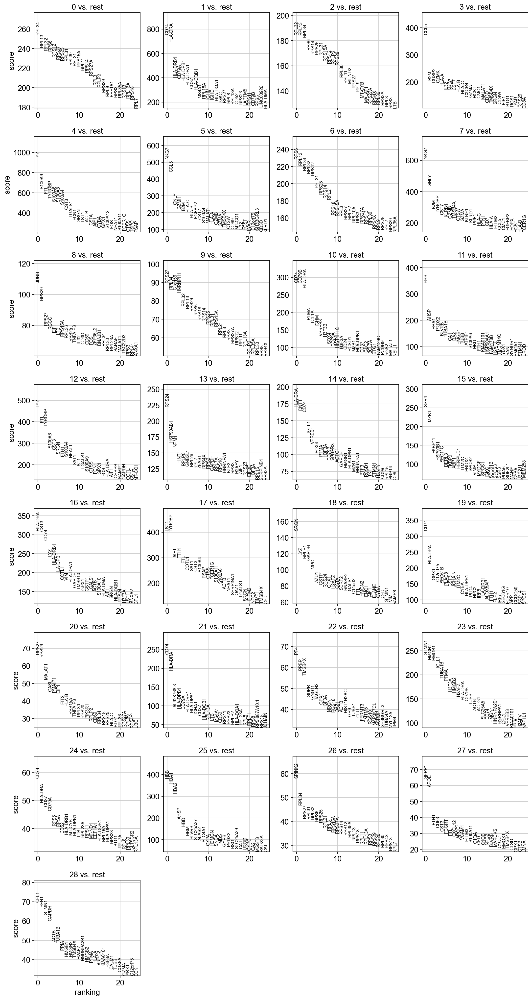

In [38]:
#Rank the highly differential genes in each cluster by using the t-test, which is the simplest and fastest method to do so.
#Note: The .raw attribute of AnnData object is used.
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [39]:
sc.settings.verbosity = 2  # reduce the verbosity

ranking genes
    finished (0:12:37)


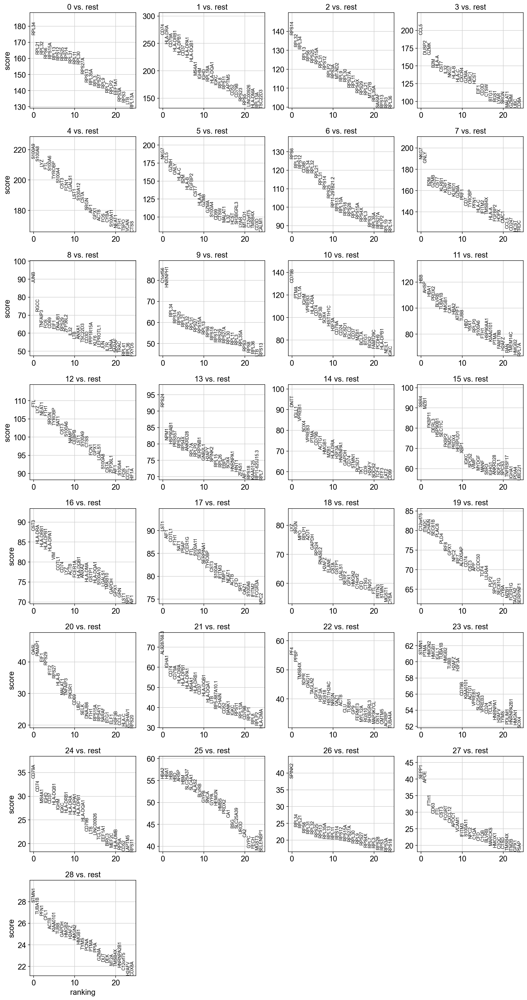

In [40]:
#Ranking using the Wilcoxon rank-sum (Mann-Whitney-U) test. They both are similar, but Wilcoxon is recommended for publications.
#Other more powerful differential testing packages using R: MAST, limma, DESeq2
#Other...for python: diffxpy
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [41]:
#Save the result
adata.write(results_file)

ranking genes


/Users/shehbeel/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


    finished (0:15:00)


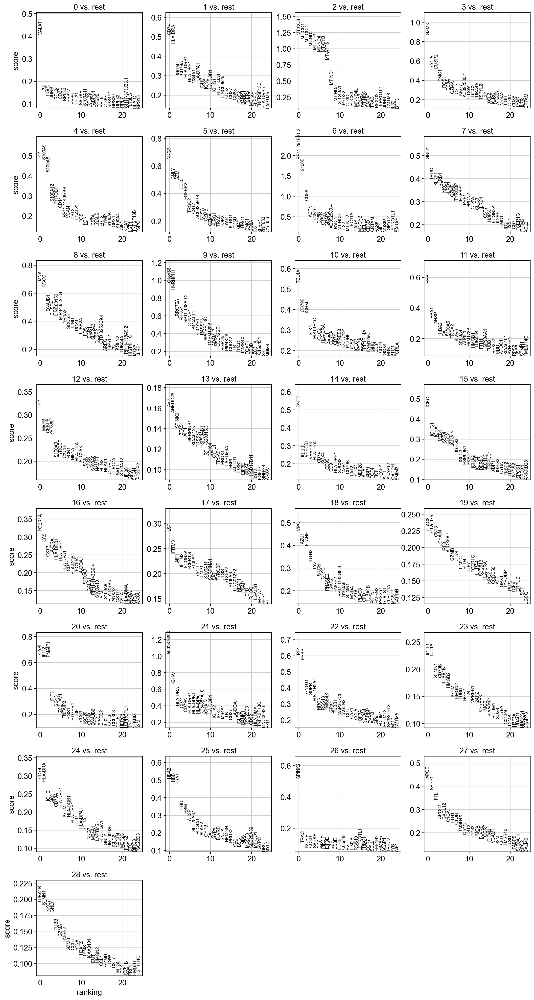

In [42]:
#Alternatively, can rank genes using logistic regression, which uses multi-variate approach, while conventional tests use uni-variate approach.
sc.tl.rank_genes_groups(adata, 'leiden', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [ ]:
# List of marker genes for later reference

In [43]:
# Reload the object that has been save with the Wilcoxon Rank-Sum test result.
adata = sc.read(results_file)

In [44]:
# Show the 10 top ranked genes per cluster 0, 1, …, 7 in a pandas dataframe.
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(5)

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
0,RPL34,CD74,RPS14,CCL5,S100A9,NKG7,RPS6,NKG7,JUNB,C1orf56,...,C12orf75,OASL,AL928768.3,PF4,STMN1,CD79A,HBA2,SPINK2,SEPP1,STMN1
1,RPL21,HLA-DRA,RPL32,DUSP2,S100A8,CCL5,RPL13,GNLY,RGCC,HNRNPH1,...,ITM2C,PMAIP1,IGHA1,PPBP,PTMA,CD74,HBA1,RPL34,APOE,TUBA1B
2,RPL32,CD79A,RPL34,GZMK,LYZ,GZMH,RPS12,B2M,TNFAIP3,RPL34,...,JCHAIN,EIF1,CD74,TMSB4X,HMGN2,MS4A1,HBB,RPL21,FTH1,PFN1
3,RPS6,HLA-DRB1,RPL13,B2M,FTL,GNLY,CD8B,GZMB,FOS,RPS14,...,SEC61B,RPS29,CD79A,SDPR,HMGB1,IGHD,HBD,RPS6,CD63,CFL1
4,RPS15A,HLA-DPB1,RPS6,HLA-A,S100A6,HLA-C,RPL34,CST7,CD69,RPS25,...,PLAC8,IFIT2,HLA-DRA,GNG11,IGLL1,CD37,AHSP,RPL31,FTL,ACTB


In [45]:
# Table with scores and groups
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,24_n,24_p,25_n,25_p,26_n,26_p,27_n,27_p,28_n,28_p
0,RPL34,0.0,CD74,0.0,RPS14,0.0,CCL5,0.0,S100A9,0.0,...,CD79A,4.003271e-250,HBA2,0.0,SPINK2,0.000000e+00,SEPP1,0.000000e+00,STMN1,8.793568e-172
1,RPL21,0.0,HLA-DRA,0.0,RPL32,0.0,DUSP2,0.0,S100A8,0.0,...,CD74,2.162269e-211,HBA1,0.0,RPL34,1.282506e-127,APOE,0.000000e+00,TUBA1B,5.251794e-159
2,RPL32,0.0,CD79A,0.0,RPL34,0.0,GZMK,0.0,LYZ,0.0,...,MS4A1,4.971684e-181,HBB,0.0,RPL21,2.549901e-124,FTH1,6.860011e-227,PFN1,2.526872e-157
3,RPS6,0.0,HLA-DRB1,0.0,RPL13,0.0,B2M,0.0,FTL,0.0,...,IGHD,1.350459e-180,HBD,0.0,RPS6,1.156085e-109,CD63,3.185661e-193,CFL1,1.621008e-152
4,RPS15A,0.0,HLA-DPB1,0.0,RPS6,0.0,HLA-A,0.0,S100A6,0.0,...,CD37,4.972078e-179,AHSP,0.0,RPL31,9.356620e-107,FTL,4.023515e-191,ACTB,4.406442e-143


ranking genes
    finished (0:02:20)


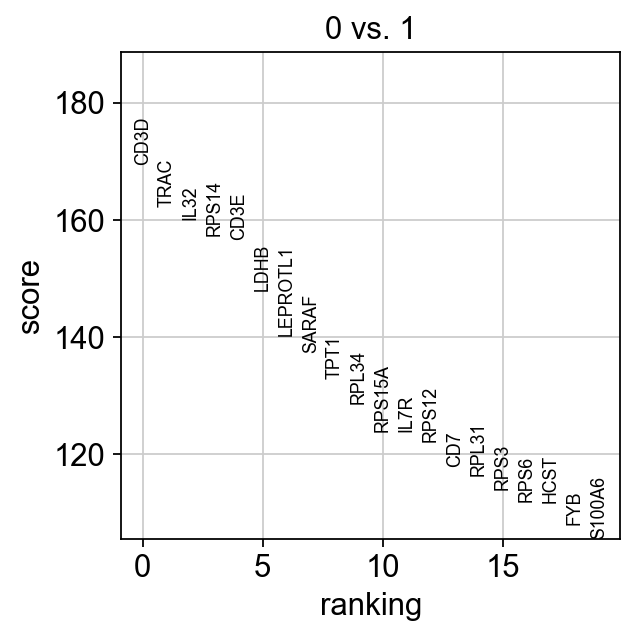

In [46]:
# Comparing among two clusters
sc.tl.rank_genes_groups(adata, 'leiden', groups=['0'], reference='1', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['0'], n_genes=20)

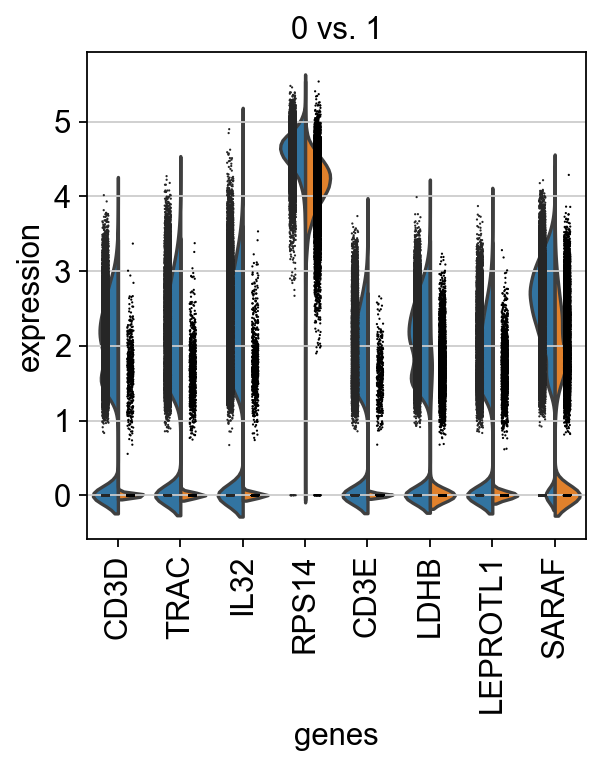

In [47]:
# Violin plot comparing among two clusters
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)

In [48]:
# Reload the object with the computed differential expression (i.e. DE via a comparison with the rest of the groups)
adata = sc.read(results_file)

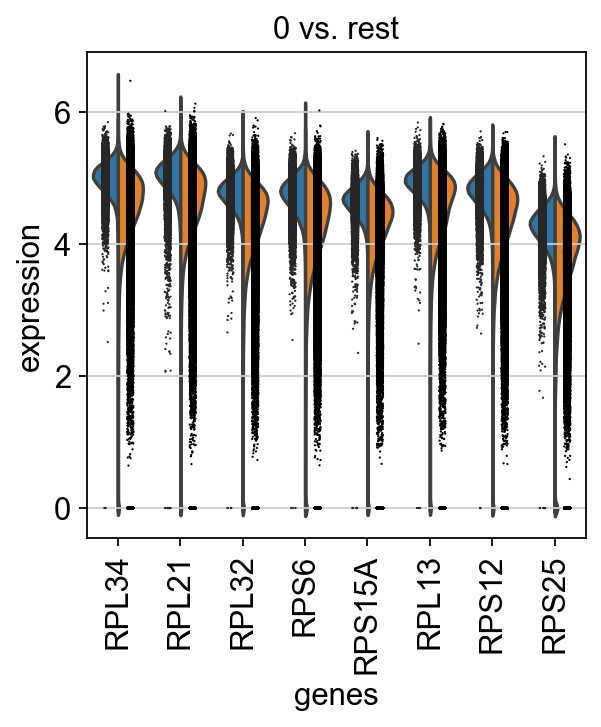

In [49]:
sc.pl.rank_genes_groups_violin(adata, groups='0', n_genes=8)

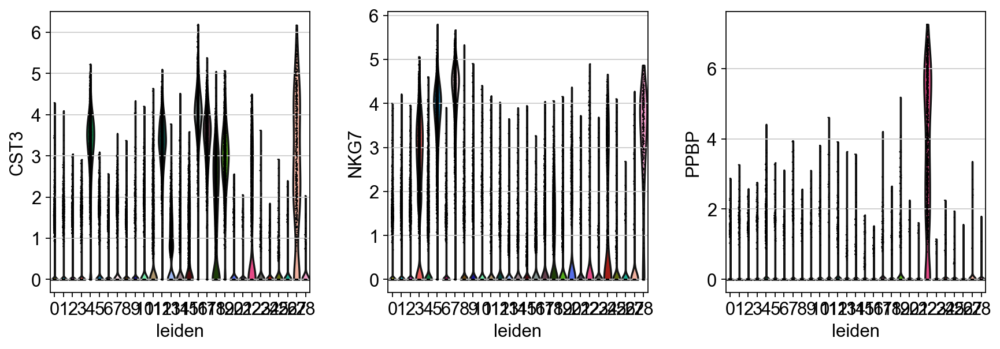

In [50]:
# To compare a certain gene across groups
sc.pl.violin(adata, ['CST3', 'NKG7', 'PPBP'], groupby='leiden')

In [ ]:
# Marking the cell types
new_cluster_names = [
    'CD4 T', 'CD14 Monocytes',
    'B', 'CD8 T',
    'NK', 'FCGR3A Monocytes',
    'Dendritic', 'Megakaryocytes']
adata.rename_categories('leiden', new_cluster_names)

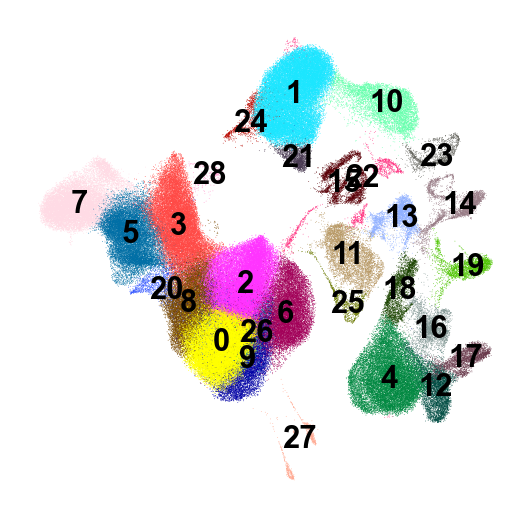

In [51]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='.pdf')